---

<img src="../images/anchormen-logo.png" width="500">

---

# BASICS Lab: Spatial Visualization Maps

In this lab session we will work on spatial visualizations. We will mostly use *Basemap* which is a powerful extension of the matplotlib visualization library with a focus on geographical projections. First we will explore the basic concepts and methods used in spatial visualization. Next we will use some interesting datasets to create more advanced maps. 



## Goals

After this lab, you will:

- have installed Basemap on your computer
- know how to use different projections in Basemap
- know how to use basic Basemap commands for plotting countries, coastlines, rivers, backgrounds, etc.
- know how to zoom in and set resolutions
- know how to plot points based on latitude/longitude values 
- know how to obtain, import and display Shapefiles
- know how to create a Choropleth Map 
- apply this to live flight data of air planes
- know other useful libraries for plotting spatial data



## Useful mapping libraries

- Geopandas
    - Lightweight, uses libraries such as pandas, geos, shapely, gdal, fiona, pyproj, rtree
    - Implements GeoDataFrame, GeoSeries objects (extensions of pandas DataFrames, Series for geospatial data)
- Gmplot
    - For quick plotting on google maps and generating interactive html, not extensive
- Plotly
- Basemap (this notebook)
    - [+] powerful library
    - [+] extensive projections
    - [+] easy plotting coastlines, countries, rivers, standard background, setting custom backgrounds, etc
    - [-] bit harder to install (on Windows)
    - [-] can be slow for some plots
    - [+] adjusting plotting granularity
    - [-] harder to plot chloropleth maps

# A. Basemap Installation

As basemap is an extension of matplotlib it requires this library to be installed as well.

### Mac  / Linux

To install Basemap run the command:
- `conda install basemap`


### Windows

There tend to be some problems installing basemap on windows using Python 3. These can be prevented by installing Basemap as follows, via a wheel file:

- Go to: http://www.lfd.uci.edu/~gohlke/pythonlibs/ and search for 'pyproj' and 'basemap' (you will need both)
- Download the approprate .whl files for 'pyproj' and 'basemap'
    - Select the right files based on your Python version (for example, marked by 'cp36' for Python 3.6) and the approprate number of bits of your Python version (32/64bit)
    - If necessary, use the commands below to find out your Python version

In [1]:
# Check Python version
!python -V
# Check number of bits of Python version
import struct; print ("Number of bits version:", struct.calcsize("P") * 8)

Python 3.5.3 :: Anaconda custom (x86_64)
Number of bits version: 64


- Open a command window in the directory where your .whl file is located and install 'pyproj' first and then 'basemap', using the pip command below. This will unpack and install the .whl file and basemap should be installed successfully.
    - `pip install <name-of-whl-file>`

*In case of problems:*

- The `basemap` installation above has been observed to fail on Windows machines without admin permissions.
- A workaround for some cases is to install Microsoft Visual Studio tools first, before installing the basemap whl file.


### Verify Basemap install

- By executing the following code without errors:

In [2]:
# Check successful installation
from mpl_toolkits.basemap import Basemap

---

# B. Projections

Basemap makes use of `projections` to visualize the Earth on a two-dimentional map.

It is good to realise that these projections will always cause a certain level of distortion, which will be particularly clear when plotting large areas (or at low zoom factors). Some projections are global, and some can only represent a portion of the globe. Note that many map projection possess one of two desirable properties - they can be equal-area (the area of features is preserved) or conformal (the shape of features is preserved). Since no map projection can have both at the same time, many compromise between the two.

Depending on the data you want to visualize you can choose one of the 24 different projections supported by Basemap: http://matplotlib.org/basemap/users/mapsetup.html

<img src="./images/xkcd-projections.png" width="400">

Commonly used projections include:
- **Equidistant Cylindrical Projection** (Basemap default): The simplest projection, just displays the world in latitude/longitude coordinates.
- **Mercator Projection**: A cylindrical, conformal projection. Very large distortion at high latitudes, cannot fully reach the polar regions.
- **Orthographic Projection**: Displays the earth as a satellite would see it.
- **Robinson Projection**: A global projection once used by the National Geographic Society for world maps.
- **Mollweide projection**: A global, elliptical, equal-area projection.



# C. Initializing first map

To draw a map, we first need to initialize a `Basemap` object. This also allows for specifying the desired map projection. Depending on the projection type additional information might be needed, such as the portions of the earth's surface that should be visualized.

Basemap includes some data on coastlines, country borders and lakes by default. More detailed data can be loaded separately.

In the cell code below we initialize a Basemap class. As we do not specify any parameters it uses the 'Equidistant Cylindrical Projection' by default (also known as 'Plate Carrée'). Furthermore we will add coastlines with the Basemap method `drawcoastlines()`, so that we will not end up with a blank map.

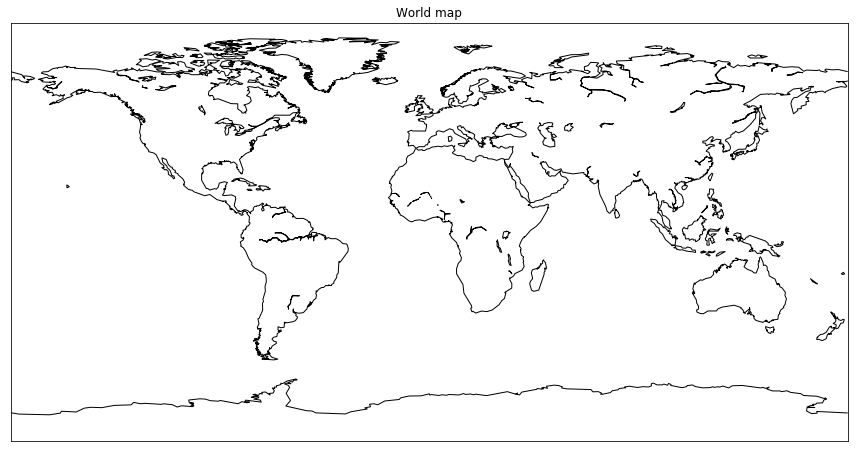

In [3]:
# Libraries
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

# Initialize figure
plt.figure(figsize=(15,18))

# Initialize Basemap object
map = Basemap()

# Add coastlines
map.drawcoastlines()

# Set title and show plot
plt.title('World map')
plt.show()

If we wanted to change the color of the coastlines we can pass in a color argument, the same holds for the thickness of the line. 

The most important parameters that can be specified for the **`drawcoastlines`** method are: 

    drawcoastlines(linewidth=1.0, linestyle=’solid’, color=’k’, ax=None)
    
Remember that you can always get more info on a specific method by invoking the **`help()`** command:

In [4]:
# Info on drawcoastlines() method
help(map.drawcoastlines)

Help on method drawcoastlines in module mpl_toolkits.basemap:

drawcoastlines(linewidth=1.0, linestyle='solid', color='k', antialiased=1, ax=None, zorder=None) method of mpl_toolkits.basemap.Basemap instance
    Draw coastlines.
    
    .. tabularcolumns:: |l|L|
    
    ==============   ====================================================
    Keyword          Description
    ==============   ====================================================
    linewidth        coastline width (default 1.)
    linestyle        coastline linestyle (default solid)
    color            coastline color (default black)
    antialiased      antialiasing switch for coastlines (default True).
    ax               axes instance (overrides default axes instance)
    zorder           sets the zorder for the coastlines (if not specified,
                     uses default zorder for
                     matplotlib.patches.LineCollections).
    ==============   ==================================================

    
**Exercise: Change the thickness of the coastlines and the color in the code cell below**. Feel free to experiment.

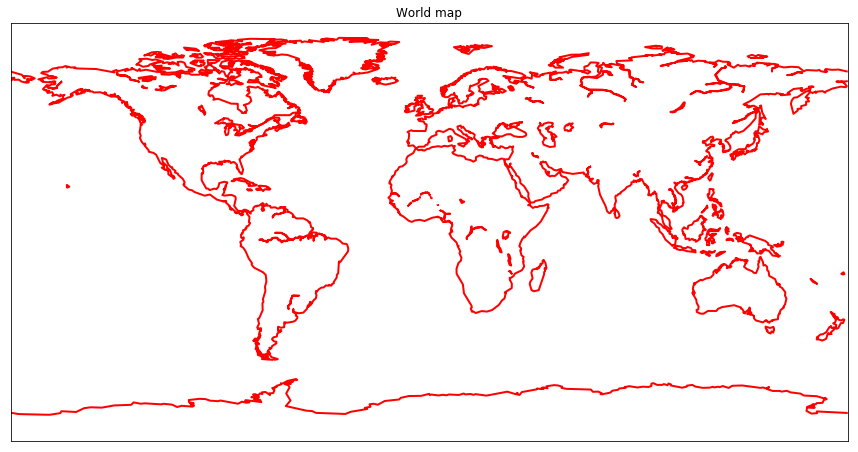

In [5]:
# Insert code. Note that Matplotlib requires you to initialize your basemap object again, after each plt.show()

plt.figure(figsize=(15,18))

map = Basemap()

map.drawcoastlines(linewidth=2.0, color='r')

# Set title and show plot
plt.title('World map')
plt.show()

---

# D. Basic Basemap methods

In the example above we added the coastlines to the map projection. Some other Basemap methods to add details to the map projection are listed below: 

- **bluemarble()**
- **etopo()**
- **fillcontinents()**
- **drawcountries()**
- **drawstates()**
- **drawrivers()**
- **drawmapboundary()**
- **drawmeridians()**
- **drawparallels()**
- **warpimage()**

Most of these have self-explanatory names. **`bluemarble()`**, **`etopo()`** and **`warpimage()`** add detailed aerial and relief images as map backgrounds (from NASA, NOAA and custom image respectively).

For more info on meaning and parameter settings for each of the Basemap methods, the Basemap documentation will come in handy during a number of the exercises below. See: http://matplotlib.org/basemap/api/basemap_api.html

**Exercise: Add some details to the previously created mapping by adding: countries, rivers and relief**

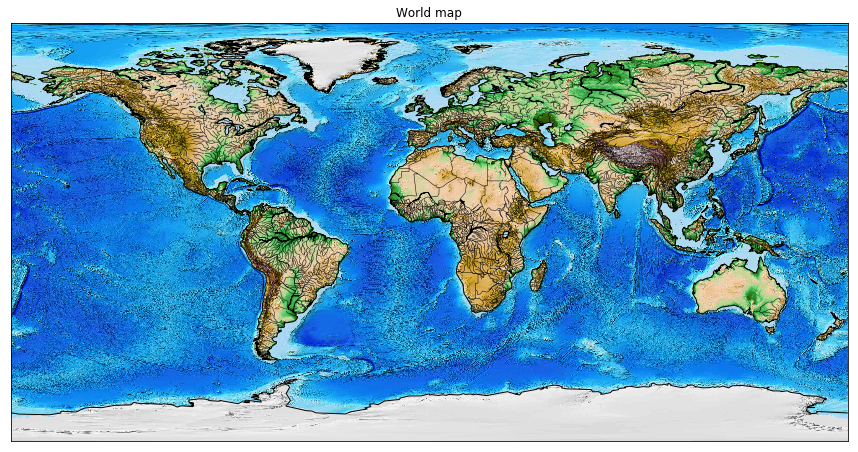

In [6]:
# Insert code 

plt.figure(figsize=(15,18))

map = Basemap()

map.drawcoastlines()
map.drawcountries()
map.drawrivers()

map.etopo()

# Set title and show plot
plt.title('World map')
plt.show()

**Exercise: Change the map projection to 'ortho' and set the lat_0 and lon_0 parameters according to your own wishes. Furthermore, add meridians and parallels.** Are you able to locate the Amazon River?

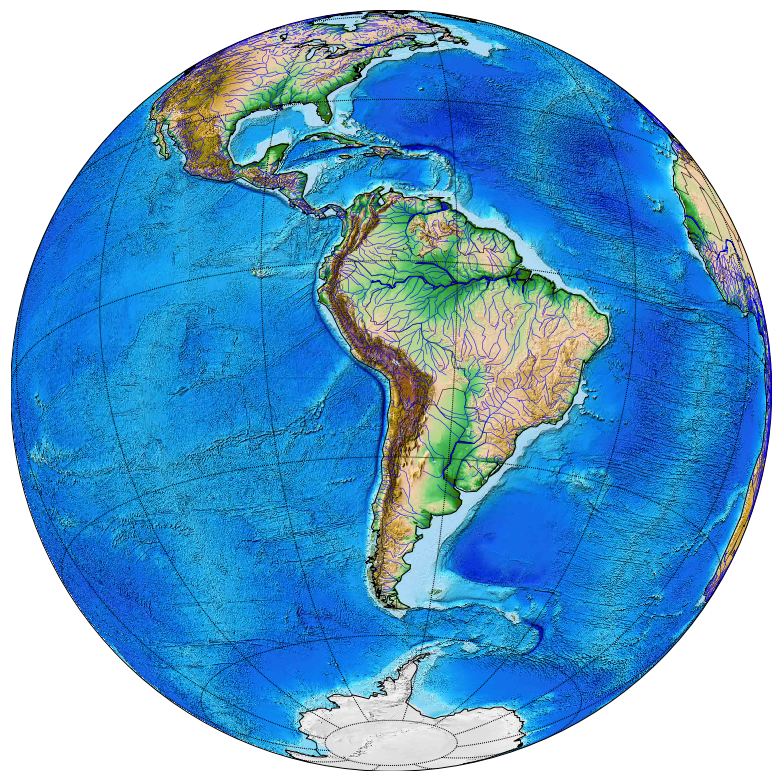

In [7]:
# Projection 'ortho'

import numpy as np

plt.figure(figsize=(14,14))

map_ortho = Basemap(projection='ortho', lat_0=-20, lon_0=-70)

map_ortho.etopo()
map_ortho.drawcoastlines()
map_ortho.drawcountries()
#map_ortho.fillcontinents(color='coral', alpha=0.2)
map_ortho.drawrivers(color='blue')

map_ortho.drawmeridians(np.arange(0, 360, 30))
map_ortho.drawparallels(np.arange(-90, 90, 30))

plt.show()

**Exercise: Now use the warpimage() method to set the following custom image as your map background. You can choose a projection of your own liking.**

Image URL: https://eoimages.gsfc.nasa.gov/images/imagerecords/79000/79765/dnb_land_ocean_ice.2012.3600x1800.jpg

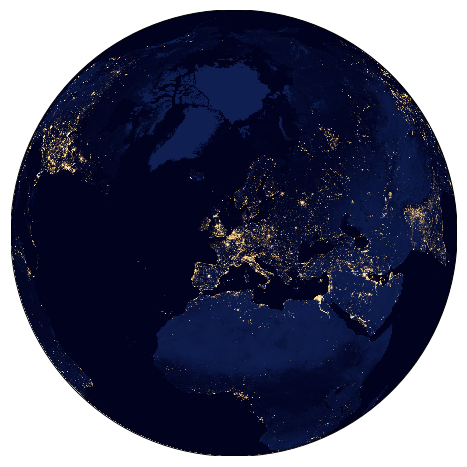

In [8]:
# Add custom image background using warpimage()

from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

plt.figure(figsize=(8,10))

map = Basemap(projection='ortho', lon_0 = 5, lat_0 = 52)

# Add custom background image using warpimage()
map.warpimage(image='https://eoimages.gsfc.nasa.gov/images/imagerecords/79000/79765/dnb_land_ocean_ice.2012.3600x1800.jpg')

plt.show()

---

# E. Zooming in

There are two options to change the portion of the earth's surface in Basemap. 

1. Provide the latitude and longitude coordinates of **each of the four corners** of the rectangular map projection region 
2. Provide the latitude and longitude coordinates of the **center** of the projection region along with the **width and height** of the region (in kilometers). 
    
In the code cell below the mapping has been zoomed to Europe, using the first method for centering/zooming the map.

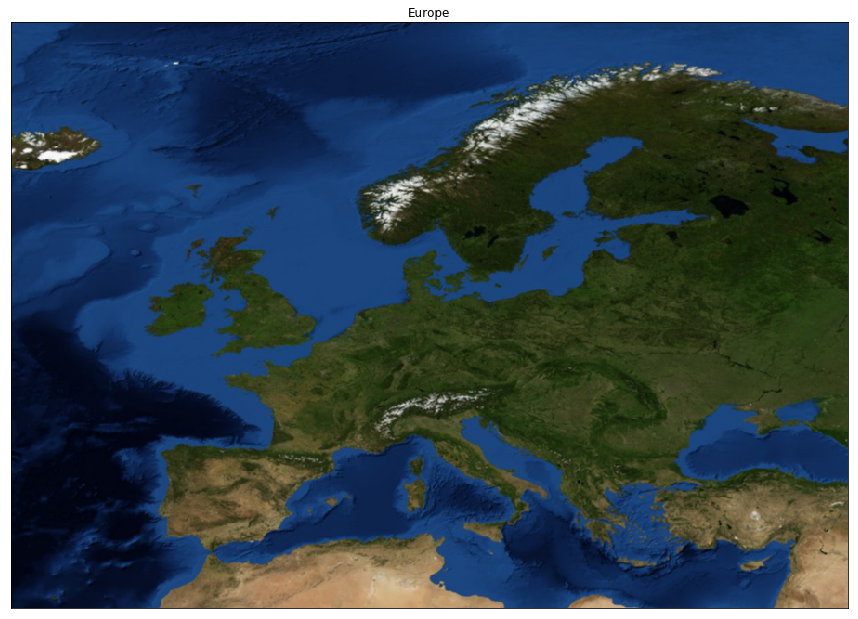

In [9]:
# Europe zoom for the Plate Carrée projection

plt.figure(figsize=(15,18))

# Coordinates of map corners
x1= -20.0
x2= 40.0
y1= 32.0
y2= 74.0

# Zoom in on coordinates
map_europe = Basemap(llcrnrlon=x1, urcrnrlon=x2, llcrnrlat=y1, urcrnrlat=y2)

map_europe.bluemarble()

# Set title and show plot
plt.title('Europe')
plt.show()

**Exercise: Use the projection 'tmerc' and zoom in on Australia.** You can ignore low resolution issues for now. We'll get to that in the next exercise.

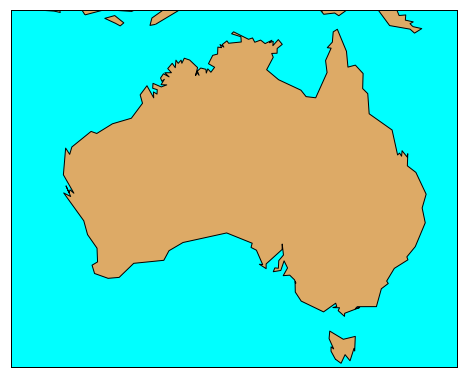

In [10]:
# Map of Australia

plt.figure(figsize=(8,10))

map = Basemap(projection='tmerc', lon_0 = 132, lat_0 = -27, width=5000000, height=4000000)

map.drawmapboundary(fill_color='aqua')
map.fillcontinents(color='#ddaa66',lake_color='aqua')
map.drawcoastlines()
map.drawcountries()

plt.show()

## Increasing the resolution

You probably noticed that some details are missing when you zoom in. For example, boundaries are very coarse and small islands don't even get plotted.

In that case you may want to:

- increase the **`resolution`** parameter, and/or
- lower the **`area_thresh`** parameter

The `area_thresh` setting specifies how large a feature must be (in square kilometers) in order to appear in the plot. The `resolution` parameter can have the following values:

- **c** (crude)
- **l** (low)
- **i** (intermediate)
- **h** (high)
- **f** (full; only if data has been installed)

Of course, there is a tradeoff between level of details and plotting speed..

**Exercise: Zoom in on The Netherlands and make sure that all 'Wadden' islands in the North are nicely visualized.**

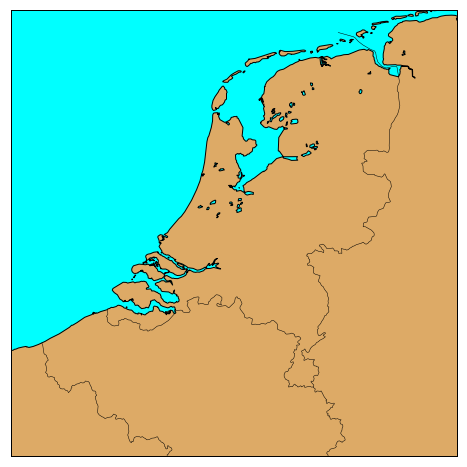

In [11]:
plt.figure(figsize=(8,10))

# Higher resolution and lower area threshold
map = Basemap(projection='tmerc', lon_0 = 5, lat_0 = 52, width=400000, height=400000, resolution='h', area_thresh=.1)

map.drawmapboundary(fill_color='aqua')
map.fillcontinents(color='#ddaa66',lake_color='aqua')
map.drawcoastlines()
map.drawcountries()

plt.show()

---

# F. Plotting points and markers on a map 

Now, let's see how we can add points to the map. Consider the map of Europe. What if we want to plot the location of Rome on it.

## Coordinate transformation

First we need to know the geographic coordinates of Rome. Simply googling this information gives us:
- Latitude = 41.8919300
- Longitude = 12.5113300

Plotting a point on the mapping is done with the **`plot()`** method. This method uses x and y parameter values, which are expressed in matplotlib frame coordinates.

To convert lon, lat geographic coordinates to x, y coordinates of matplotlib, we use the initialized Basemap object:

    map_europe = Basemap(...)
    x, y = map_europe(lon, lat)

Note that for some projections `x` and `y` can be equal to `lon` and `lat`. This is not true in general though. For example, the orthographic projection that we've seen before uses a nonlinear transformation for this.


## Matplotlib Markers

Furthermore, the plot() method in matplotlib allows for some optional parameter settings:
- markersize 
- markerstyle 
- markercolor
    
In the example below we use a red circle marker, which is denoted by the `ro` argument. A green plus marker would have been denoted by `g+`, for example.

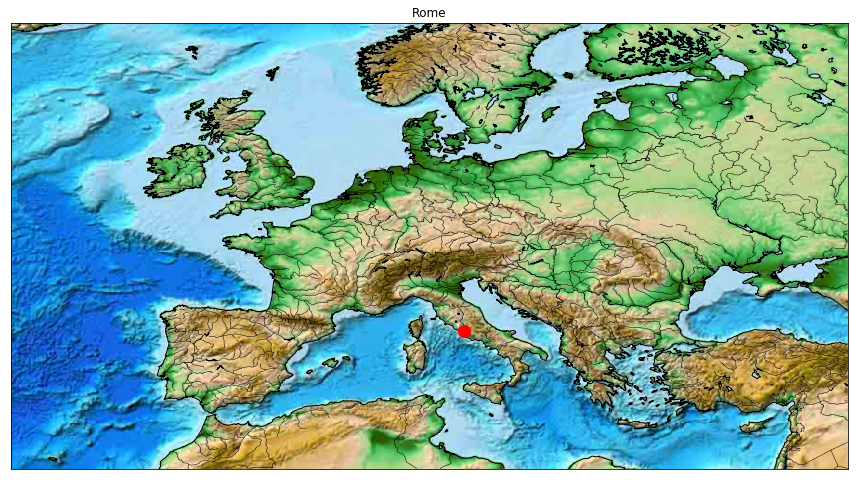

In [12]:
# Europe zoom for the Plate Carrée projection

plt.figure(figsize=(15,18))

# Coordinates of map corners
x1= -20.
x2= 40.
y1= 32.
y2= 64.

map_europe = Basemap(llcrnrlon=x1, urcrnrlon=x2, llcrnrlat=y1, urcrnrlat=y2, resolution='i')

map_europe.etopo()
map_europe.drawcoastlines()
map_europe.drawcountries()
map_europe.drawrivers()

# Coordinates of marker
lon = 12.5113300
lat = 41.8919300
# Convert lon, lat coordinates to x, y coordinates in matplotlib plot
x, y = map_europe(lon, lat)
# Plot marker at x, y coordinates
map_europe.plot(x, y, 'ro', markersize=12)

# Set title and show plot
plt.title('Rome')
plt.show()

**Exercise: Plot the location of Amsterdam on the map using a projection of your own liking.**

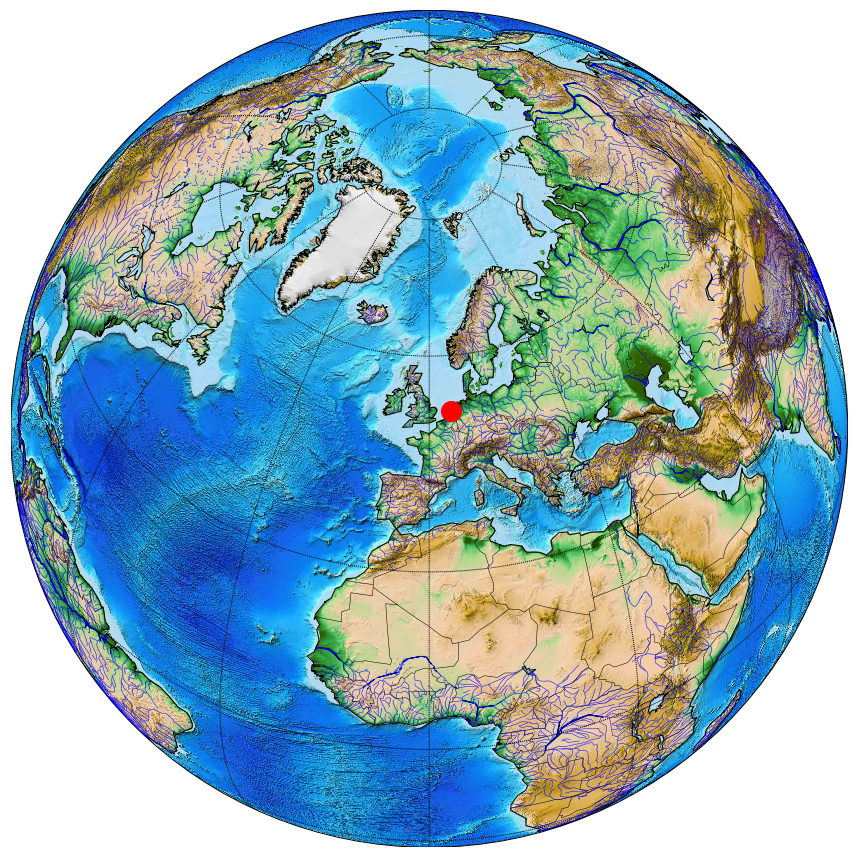

In [13]:
# Plot Amsterdam as a point on the map of the Netherlands

plt.figure(figsize=(15,18))

map_ortho = Basemap(projection='ortho', lon_0 = 0, lat_0 = 50)

# Plot coordinates of Amsterdam
lon = 4.899431
lat = 52.379189
x,y = map_ortho(lon, lat)
map_ortho.plot(x, y, 'ro', markersize=20)

# Map features
map_ortho.etopo()
map_ortho.drawcoastlines()
map_ortho.drawcountries()
map_ortho.drawrivers(color='blue')
map_ortho.drawmeridians(np.arange(0, 360, 30))
map_ortho.drawparallels(np.arange(-90, 90, 30))

# Show
plt.show()

## Plotting multiple points 

To plot multiple points we can store the latitudes and longitudes of our points of interest in two separate lists, now you simply map these to the x an y coordinates and use the same procedure using the `plot()` function. 

Here we plot some of the capitals of countries in Europe:

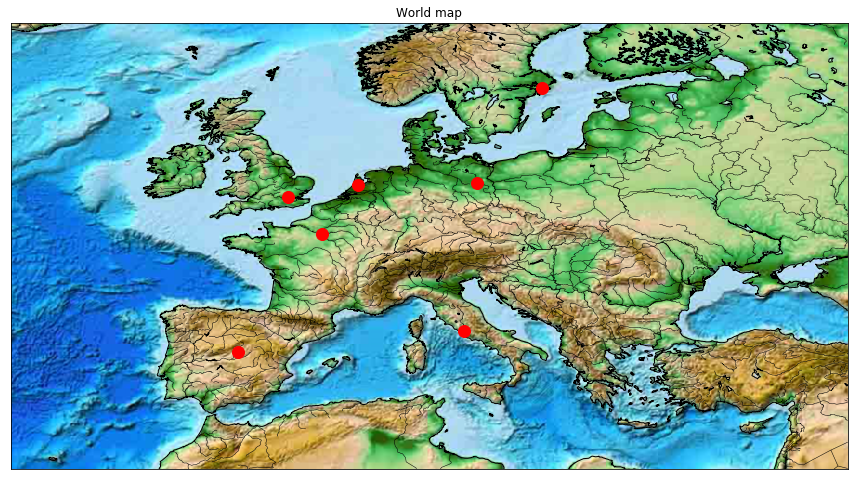

In [14]:
plt.figure(figsize=(15,18))

x1= -20.
x2= 40.
y1= 32.
y2= 64.

map = Basemap(llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2, resolution='i')

map.drawcoastlines()
map.drawcountries()
map.drawrivers()
map.etopo()

lon = [12.5113300, 4.899431, 13.4105300, -0.118092, -3.707398, 2.294694, 18.063240]
lat = [41.8919300, 52.379189, 52.5243700, 51.509865, 40.415363, 48.858093, 59.334591]
x,y = map(lon, lat)
map.plot(x, y, 'ro', markersize=12)

# Set title and show plot
plt.title('World map')
plt.show()

### Plotting lines and arcs

If we want to plot a line between two points, we can simpy pass in both latitude and longitude values in a list as we did with plotting multiple points. But now change the marker setting to `None`, using these settings a line will be drawn using both points. So by eliminating the markers we get a line.

A more accurate way would be to use the `drawgreatcircle()` method of Basemap, which plots an arc between 2 points over the surface of the Earth.

**Exercise: Use the above plot and add a line from Amsterdam to Rome to it.**

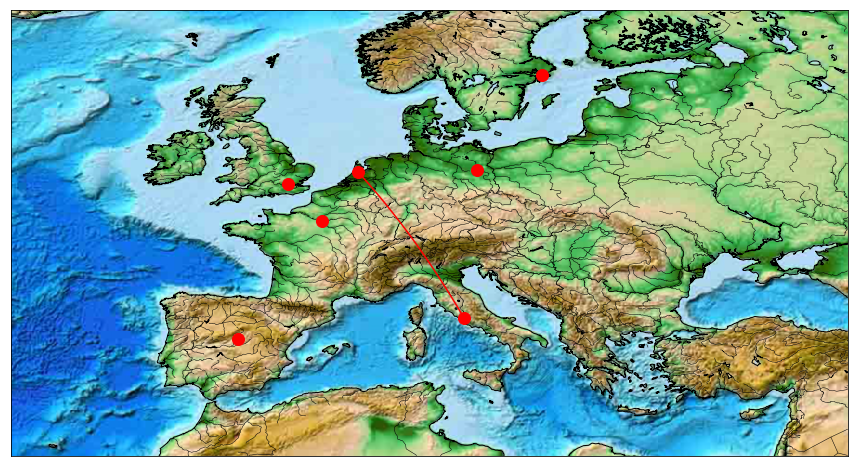

In [15]:
plt.figure(figsize=(15,18))

x1= -20.
x2= 40.
y1= 32.
y2= 64.

map = Basemap(llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2, resolution='i')

map.drawcoastlines()
map.drawcountries()
map.drawrivers()
map.etopo()

lon = [12.5113300, 4.899431, 13.4105300, -0.118092, -3.707398, 2.294694, 18.063240]
lat = [41.8919300, 52.379189, 52.5243700, 51.509865, 40.415363, 48.858093, 59.334591]
x, y = map(lon, lat)
map.plot(x, y, 'ro', markersize=12)

lon_ams_rome = [12.5113300, 4.899431]
lat_ams_rome = [41.8919300, 52.379189]
x_ams_rome, y_ams_rome = map(lon_ams_rome, lat_ams_rome)
#map.plot(x_ams_rome, y_ams_rome, marker=None, color='r')
map.drawgreatcircle(lon1=lon_ams_rome[0], lon2=lon_ams_rome[1], lat1=lat_ams_rome[0], lat2=lat_ams_rome[1], color='r')

plt.show()

---

# G. Shapefiles 

In the field of geographical visualization a lot of data is stored as so called `shapefiles`. A shapefile is a vector data format that stores vector features for example; points, lines, polygons which can represent rivers, municipality borders etc. 

A shapefile is not just one file as the name suggests, but contains a collection of files with a common filename prefix, stored in the same directory. Important to know is that there are 3 mandatory files, with the following extensions:

- **`.shp`** — shape format; the **feature geometry itself**
- **`.shx`** — shape index format; a positional index of the feature geometry to allow seeking forwards and backwards quickly
- **`.dbf`** — attribute format; columnar attributes for each shape, in dBase IV format

There are also several optional files in the shapefile format. The most significant of these is the **`.prj`** file which describes the coordinate system and projection information used.


### Mapping provinces of the Netherlands

For this section we will use the shape file in subdirectory `borders/NLD_adm_shp`, which contains all provinces and municipalities of The Netherlands.

Note that it has been retrieved from http://www.gadm.org/country (searching for 'Netherlands', selecting the Fileformat 'Shapefile', followed by unzipping the downloaded file 'NLD_adm_shp.zip').

Shapefiles are read with the Basemap method: `readshapefile('location_of_shapefile', 'access_name')`

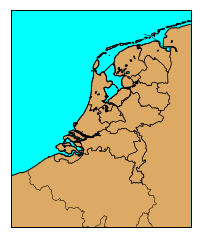

In [16]:
# In this example we show how to plot each Province of the netherlands using a Shapefile

from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

x1= 2.
x2= 8.
y1= 50.
y2= 54.

map = Basemap(llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2, projection='tmerc', lat_0 = 39.5, lon_0 = 1, resolution = 'h', area_thresh = 0.1)

map.drawmapboundary(fill_color='aqua')
map.fillcontinents(color='#ddaa66',lake_color='aqua')
map.drawcoastlines()
map.drawcountries()

location_shapefile = 'borders/NLD_adm_shp/NLD_adm1'
map.readshapefile(location_shapefile, 'Netherlands')

plt.show()

### Mapping the municipalities of the Netherlands

The shapefile contains different information levels, if we look in the folder we can also note that there is a shapefile with the name 'NLD_adm2' this contains information on the municipalities of the Netherlands. 

**Exercise: Map all municipalities of the Netherlands.**

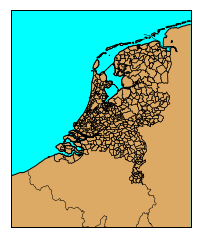

In [17]:
# In this example we show how to plot each Province of the netherlands making use of a Shapefile

x1= 2.
x2= 8.
y1= 50.
y2= 54.

map = Basemap(llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2, projection='tmerc', lat_0 = 39.5, lon_0 = 1, resolution = 'h', area_thresh = 0.1)

map.drawmapboundary(fill_color='aqua')
map.fillcontinents(color='#ddaa66',lake_color='aqua')
map.drawcoastlines()
map.drawcountries()

location_shapefile = 'borders/NLD_adm_shp/NLD_adm2'
map.readshapefile(location_shapefile, 'Netherlands')

plt.show()

--- 


# H. Choropleth Example: 

A choropleth map is used to visualize data that varies across geographic regions. The data is mapped to different colors. A choropleth is often used to visualize election results. 

For this example we will use open data by the World Bank that shows forest area as a percentage of land area in 2012. 

We will show the following steps:

1. Obtaining the country data to be visualized
2. Obtaining the shapefile with country borders
3. Adding a color scheme to the data
4. Visualizing the country data on a world map

### Obtaining the country data

We will automatically download the data from http://api.worldbank.org/v2/en/indicator/AG.LND.FRST.ZS and unzip it. The unzipped file that we are going to use will be stored in a temp directory with file name API_AG.LND.FRST.ZS_DS2_en_csv_v2.csv.

In [18]:
# Libraries
# Note: Install wget using 'pip install wget' (not with conda!)
import wget
import zipfile
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from mpl_toolkits.basemap import Basemap

# File locations
tmp_directory = 'temp'
data_url = 'http://api.worldbank.org/v2/en/indicator/AG.LND.FRST.ZS?downloadformat=csv'
data_file = tmp_directory + '/' + 'API_AG.LND.FRST.ZS_DS2_en_csv_v2.csv'

# Download data file in zip format
data_file_zip = wget.download(data_url, out=tmp_directory)

# Unzip zipped data file
zip_ref = zipfile.ZipFile(data_file_zip, 'r')
zip_ref.extractall(tmp_directory)
zip_ref.close()

# Read data (note that we will only use the 2012 data)
year = '2012'
df = pd.read_csv(data_file, skiprows=4, usecols=['Country Name', 'Country Code', year], index_col='Country Code')

In [19]:
# Inspect the data
df.head()

,Country Name,2012
Country Code,,
ABW,Aruba,2.333333
AFG,Afghanistan,2.067825
AGO,Angola,46.707628
ALB,Albania,28.262044
AND,Andorra,34.042553


### Obtaining the shapefile with country borders

We also need a shapefile with country borders to draw the mapping. We used the Admin 0 - Countries with lakes from Natural Earth Data: http://www.naturalearthdata.com/downloads/10m-cultural-vectors/

In [20]:
# File locations
shapefile_url = 'http://www.naturalearthdata.com/http//www.naturalearthdata.com/download/10m/cultural/ne_10m_admin_0_countries.zip'
shapefile_file = tmp_directory + '/' + 'ne_10m_admin_0_countries'

# Download data file in zip format
shapefile_zip = wget.download(shapefile_url, out=tmp_directory)

# Unzip zipped data file
zip_ref = zipfile.ZipFile(shapefile_zip, 'r')
zip_ref.extractall(tmp_directory)
zip_ref.close()

### Adding a color scheme to the data

In the following code cell we manually add a color scheme to the data in the following way:

    - adding a bin column to the dataframe 
    - creating a color scheme of 9 different saturations from the green palette
    - mapping the forest data to the 9 color bins 
    - dropping rows that have NaN values

In [21]:
# Number of bins for colors to plot
num_colors = 9

values = df[year]
cm = plt.get_cmap('Greens')
scheme = [cm(i / num_colors) for i in range(num_colors)]
bins = np.linspace(values.min(), values.max(), num_colors)
df['bin'] = np.digitize(values, bins) - 1

df.dropna(inplace=True)
df.sort_values('bin', ascending=False).head(10)

,Country Name,2012,bin
Country Code,,,
SUR,Suriname,98.355128,8
PLW,Palau,87.608696,7
FSM,"Micronesia, Fed. Sts.",91.685714,7
GAB,Gabon,86.932899,7
ASM,American Samoa,88.200000,7
SYC,Seychelles,88.413043,7
SLB,Solomon Islands,78.663809,6
GUY,Guyana,84.104648,6
CSS,Caribbean small states,85.210374,6


### Visualizing the country data on a world map

** Needed information: ** 

- The 'ADM0_A3' information corresponds to the 'Country Code' in the GDP data and which we need to specifiy the color based on the corresponding bin data. 

- The coloring is generated using the `PatchCollection` in `matplotlib`.

/Users/dennis/anaconda/lib/python3.5/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)
/Users/dennis/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:16: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


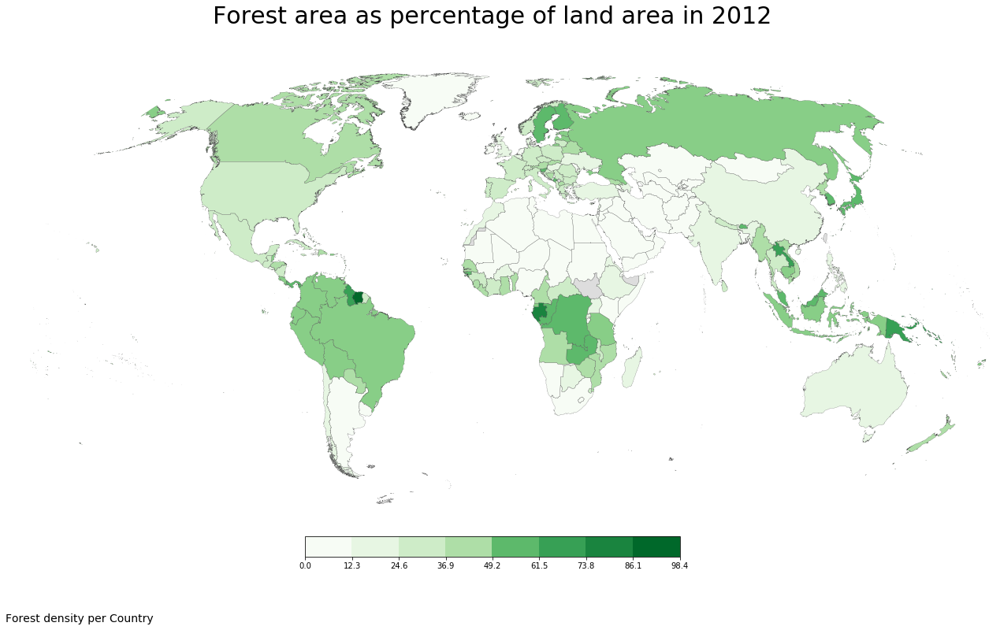

In [22]:
fig = plt.figure(figsize=(22, 12))

ax = fig.add_subplot(111, axisbg='w', frame_on=False)
fig.suptitle('Forest area as percentage of land area in {}'.format(year), fontsize=30, y=.95)

m = Basemap(lon_0=0, projection='robin')
m.drawmapboundary(color='w')

# Connect the 'Country Code' in the World Bank dataset to the 'ADM0_A3' field in the shapefile
m.readshapefile(shapefile_file, 'units', color='#444444', linewidth=.2)
for info, shape in zip(m.units_info, m.units):
    iso3 = info['ADM0_A3']
    if iso3 not in df.index:
        color = '#dddddd'
    else:
        color = scheme[df.ix[iso3]['bin']]

    patches = [Polygon(np.array(shape), True)]
    pc = PatchCollection(patches)
    pc.set_facecolor(color)
    ax.add_collection(pc)

# Cover up Antarctica so legend can be placed over it
ax.axhspan(0, 1000 * 1800, facecolor='w', edgecolor='w', zorder=2)

# Draw color legend
ax_legend = fig.add_axes([0.35, 0.14, 0.3, 0.03], zorder=3)
cmap = mpl.colors.ListedColormap(scheme)
cb = mpl.colorbar.ColorbarBase(ax_legend, cmap=cmap, ticks=bins, boundaries=bins, orientation='horizontal')
cb.ax.set_xticklabels([str(round(i, 1)) for i in bins])

# Set the map footer
plt.annotate('Forest density per Country', xy=(-.8, -3.2), size=14, xycoords='axes fraction')

plt.show()

---

# [optional/skip] Choropleth Exercise: Plotting  Global Development Indicators

- Download Global Development Indicator data from the World Bank and plot GDP/capita for each country on the world map.
    - Data description: http://data.worldbank.org/data-catalog/world-development-indicators
    - Data file: http://databank.worldbank.org/data/download/WDI_csv.zip
    
Using the code cells below try to make a choropeth based on the GDP data. As in the example use bins to use coloring dependent on the GDP data for each country. 

Use the same shapefile as in the example (called `ne_10m_admin_0_countries`).

## Data

In [23]:
# Libraries
import os.path
import wget
import zipfile
import pandas as pd
import numpy as np
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

# File locations
data_WDI_url = 'http://databank.worldbank.org/data/download/WDI_csv.zip'
data_WDI_file = tmp_directory + '/' + 'WDIData.csv'

# Check if datafile already exists
if(not(os.path.exists(data_WDI_file))):
    # Download data file in zip format, to tmp_directory
    print("Downloading data from", data_WDI_url, "..")
    data_WDI_zip = wget.download(data_WDI_url, out=tmp_directory)
    print("Data downloaded to", data_WDI_zip)

    # Unzip zipped data file, in tmp_directory
    print("Extracting data file", data_WDI_zip, "..")
    zip_ref = zipfile.ZipFile(data_WDI_zip, 'r')
    zip_ref.extractall(tmp_directory)
    zip_ref.close()
    print("Data extracted to", tmp_directory)

# Read data
print("Reading data from", data_WDI_file, "..")
df_WDI = pd.read_csv(data_WDI_file)
print("Data read from", data_WDI_file)

# Show data
df_WDI.head()

Data downloaded to temp/WDI_csv.zip
Extracting data file temp/WDI_csv.zip ..
Data extracted to temp
Reading data from temp/WDIData.csv ..
Data read from temp/WDIData.csv


,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,Unnamed: 62
0,Arab World,ARB,"2005 PPP conversion factor, GDP (LCU per inter...",PA.NUS.PPP.05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"2005 PPP conversion factor, private consumptio...",PA.NUS.PRVT.PP.05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,Access to clean fuels and technologies for coo...,EG.CFT.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,83.474617,84.006076,84.416148,84.734574,85.003645,85.244971,NaN,NaN,NaN,NaN
3,Arab World,ARB,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,84.655338,85.955345,86.392313,86.846966,87.604961,88.039125,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Access to electricity, rural (% of rural popul...",EG.ELC.ACCS.RU.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,71.765345,73.734266,74.500717,75.218497,76.712250,77.407269,NaN,NaN,NaN,NaN


In [24]:
# Subset data (select indicator and year, subset and rename columns)
selected_indicator = 'GDP per capita, PPP (current international $)'
selected_year = '2014'

df_WDI_selected = df_WDI.loc[
    df_WDI['Indicator Name'] == selected_indicator, 
    ['Country Name', 'Country Code', selected_year]]
df_WDI_selected = df_WDI_selected.dropna()
new_indicator = selected_indicator + ", " + selected_year
df_WDI_selected.columns = ['Country Name', 'Country Code', 'GDP per capita']

# Explore
df_WDI_selected.head()

,Country Name,Country Code,GDP per capita
521,Arab World,ARB,15948.420015
2074,Caribbean small states,CSS,15207.149261
3627,Central Europe and the Baltics,CEB,25036.969527
5180,Early-demographic dividend,EAR,8387.701726
6733,East Asia & Pacific,EAS,15271.611608


In [25]:
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

num_colors = 9

title = 'GDP data on world map'
imgfile = 'GDP_world_map.png'
description = 'GDA numbers'

values = df_WDI_selected['GDP per capita']
cm = plt.get_cmap('YlOrBr')
scheme = [cm(i / num_colors) for i in range(num_colors)]
bins = np.linspace(values.min(), values.max(), num_colors)
df_WDI_selected['bin'] = np.digitize(values, bins) - 1
df_WDI_selected.sort_values('bin', ascending=False).head(10)

,Country Name,Country Code,GDP per capita,bin
253660,"Macao SAR, China",MAC,137736.949815,8
318886,Qatar,QAT,127313.494355,7
252107,Luxembourg,LUX,101831.751218,5
116996,Brunei Darussalam,BRN,80152.139184,4
236577,Kuwait,KWT,74613.953855,4
337522,Singapore,SGP,84593.428145,4
205517,"Hong Kong SAR, China",HKG,55514.510939,3
393430,United States,USA,54598.550689,3
300250,Norway,NOR,65655.459464,3
50217,North America,NAC,53643.456942,3


In [26]:
# Read info in a shapefile, so we can point the Country Code (index) data to the data in the shapefile

/Users/dennis/anaconda/lib/python3.5/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


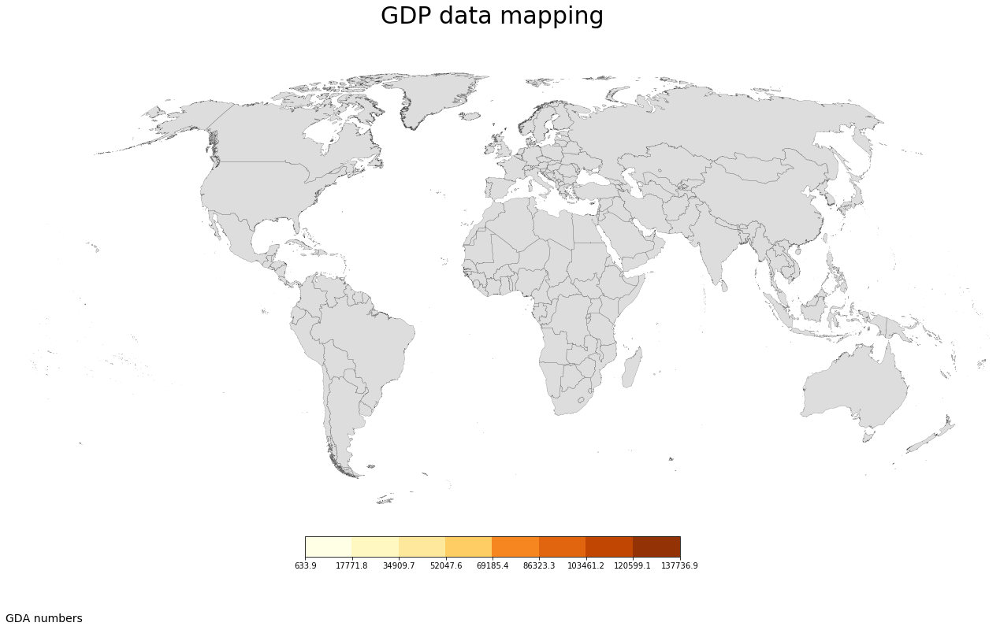

In [27]:
fig = plt.figure(figsize=(22, 12))

ax = fig.add_subplot(111, axisbg='w', frame_on=False)
fig.suptitle('GDP data mapping', fontsize=30, y=.95)

map = Basemap(lon_0=0, projection='robin')
map.drawmapboundary(color='w')

map.readshapefile(shapefile_file, 'units', color='#444444', linewidth=.2)
for info, shape in zip(map.units_info, map.units):
    iso3 = info['ADM0_A3']
    if iso3 not in df_WDI_selected.index:
        color = '#dddddd'
    else:
        color = scheme[df_WDI_selected.ix[iso3]['bin']]

    patches = [Polygon(np.array(shape), True)]
    pc = PatchCollection(patches)
    pc.set_facecolor(color)
    ax.add_collection(pc)

# Cover up Antarctica so legend can be placed over it.
ax.axhspan(0, 1000 * 1800, facecolor='w', edgecolor='w', zorder=2)

# Draw color legend.
ax_legend = fig.add_axes([0.35, 0.14, 0.3, 0.03], zorder=3)
cmap = mpl.colors.ListedColormap(scheme)
cb = mpl.colorbar.ColorbarBase(ax_legend, cmap=cmap, ticks=bins, boundaries=bins, orientation='horizontal')
cb.ax.set_xticklabels([str(round(i, 1)) for i in bins])

# Set the map footer.
plt.annotate(description, xy=(-.8, -3.2), size=14, xycoords='axes fraction')

plt.show()

---

# I. Case: Plotting Live Flight Data 


## Data Source

This script retrieves data from The OpenSky Network: https://opensky-network.org/

The OpenSky Network has a free open-source API for real-time air traffic data. In its current version it allows users to retrieve live (and partially historical data). The data is retrieved by a network of ADS-B receivers and consists of

- ICAO 24-bit transponder ID to identify the aircraft
- the flight's callsign
- aircraft's current location (latitude, longitude, altitude)
- aircraft's current horizontal and vertical velocity plus heading
- Unix timestamps which indicate the age of each field

It's a REST API which provides all these data in JSON. They also provide simple Java and Python bindings.

Their official API documentation can be found at: https://opensky-network.org/apidoc/

The sources for the Java and Python bindings can be found on github: https://github.com/openskynetwork/opensky-api

In [28]:
import pandas as pd
import numpy as np
import datetime
import gmplot

In [29]:
def unixtime_to_datetime(time):
    if(np.isnan(time)):
        return np.nan
    else:
        return(datetime.datetime.fromtimestamp(time))

def clean_opensky_dataframe(df):
    # Create variables from 'states' list
    df['icao24'] = df.apply(lambda row: row.states[0], axis=1)
    df['callsign'] = df.apply(lambda row: row.states[1], axis=1)
    df['origin_country'] = df.apply(lambda row: row.states[2], axis=1)
    df['time_position'] = df.apply(lambda row: row.states[3], axis=1)
    df['time_velocity'] = df.apply(lambda row: row.states[4], axis=1)
    df['longitude'] = df.apply(lambda row: row.states[5], axis=1)
    df['latitude'] = df.apply(lambda row: row.states[6], axis=1)
    df['altitude'] = df.apply(lambda row: row.states[7], axis=1)
    df['on_ground'] = df.apply(lambda row: row.states[8], axis=1)
    df['velocity'] = df.apply(lambda row: row.states[9], axis=1)
    df['heading'] = df.apply(lambda row: row.states[10], axis=1)
    df['vertical_rate'] = df.apply(lambda row: row.states[11], axis=1)
    df['sensors'] = df.apply(lambda row: row.states[12], axis=1)

    # Drop 'states'
    df.drop('states', axis=1, inplace=True)

    # Convert timestamps
    df['time'] = df['time'].apply(unixtime_to_datetime)
    df['time_position'] = df['time_position'].apply(unixtime_to_datetime)
    df['time_velocity'] = df['time_velocity'].apply(unixtime_to_datetime)
    
    return(df)

## Retrieve Data from REST API

See documentation: https://opensky-network.org/apidoc/rest.html

In [30]:
# Read from OpenSky API
df = pd.read_json("https://opensky-network.org/api/states/all")

# Clean dataframe
df = clean_opensky_dataframe(df)

In [31]:
df.head(3)

,time,icao24,callsign,origin_country,time_position,time_velocity,longitude,latitude,altitude,on_ground,velocity,heading,vertical_rate,sensors
0,2017-12-15 00:13:10,a808c4,,United States,2017-12-14 23:57:08,2017-12-15 00:13:08,-72.1106,42.6214,14721.84,False,228.10,99.74,-9.75,None
1,2017-12-15 00:13:10,a981b1,N711VT,United States,2017-12-15 00:13:06,2017-12-15 00:13:06,-98.0497,41.4890,13106.40,False,233.75,243.89,0.00,None
2,2017-12-15 00:13:10,a086d8,FDX3708,United States,2017-12-15 00:13:09,2017-12-15 00:13:09,-90.1295,39.5376,10980.42,False,192.80,266.33,0.00,None


In [32]:
# Select entries without NaN coordinates
flying = df.loc[(np.isnan(df['latitude']) == False) & (np.isnan(df['longitude']) == False) & (df['on_ground'] == False)]
grounded = df.loc[(np.isnan(df['latitude']) == False) & (np.isnan(df['longitude']) == False) & (df['on_ground'] == True)]

# Create arrays for latitudes/longitudes
flying_latitudes = np.array(flying.latitude)
flying_longitudes = np.array(flying.longitude)
grounded_latitudes = np.array(grounded.latitude)
grounded_longitudes = np.array(grounded.longitude)

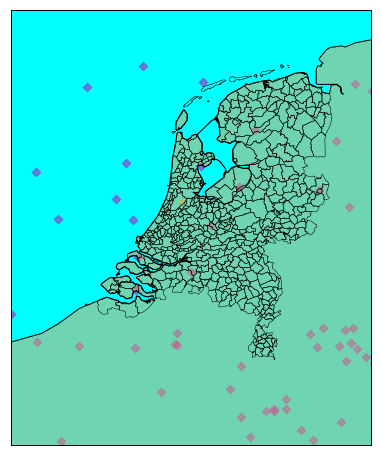

In [33]:
#Source of the shape file: http://www.gadm.org/download
# NLD_adm1 --> provinces 
# NLD_adm2 --> municipalities

import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

fig = plt.figure(figsize=(8, 8))

x1= 2.
x2= 8.
y1= 50.
y2= 54.

map = Basemap(llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2, resolution='i', projection='tmerc', lat_0 = 39.5, lon_0 = 1)

map.drawmapboundary(fill_color='aqua')
map.fillcontinents(color='#ddaa66',lake_color='aqua', alpha=0.5) #doe een doorzichtige kleur!
map.drawcoastlines()

map.readshapefile('borders/NLD_adm_shp/NLD_adm2', 'comarques')

x, y = map(flying_longitudes, flying_latitudes)
map.scatter(x, y, marker='D',color='m', alpha = 0.5)

x, y = map(grounded_longitudes, grounded_latitudes)
map.scatter(x, y, marker='o',color='y', alpha = 0.5)

plt.show()

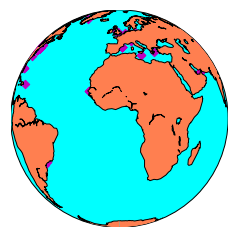

In [34]:
# Plotting the data on a different projection

from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

map = Basemap(projection='ortho', 
              lat_0=0, lon_0=0)

map.drawmapboundary(fill_color='aqua')
map.fillcontinents(color='coral',lake_color='aqua')
map.drawcoastlines()

lons = grounded_longitudes 
lats = grounded_latitudes

x, y = map(lons, lats)
map.scatter(x, y, marker='D',color='m')

plt.show()

# J. Summary

In this notebook we worked with Basemap and learned about the following:

- Mapping libraries
    - Basemap
    - Geopandas
    - Plotly
    - Gmplot
- Basemap installation
- Projections
    - Equidistant Cylindrical
    - Mercator
    - Orthographic
    - Robinson
    - Mollweide
- Initializing first map
- Basic Basemap commands
    - bluemarble()
    - etopo()
    - fillcontinents()
    - drawcountries()
    - drawstates()
    - drawrivers()
    - drawmapboundary()
    - drawmeridians()
    - drawparallels()
    - warpimage()
- Zooming in
    - Increasing resolution
- Points and markers
    - Coordinate transformation
    - Matplotlib markers
    - Plotting multiple points
    - Plotting lines and arcs
- Shapefiles
    - Mapping provinces
    - Mapping municipalities
- Choropleth example
- Plotting live flight data



# K. Additional Resources


## Documentation & examples

- Basemap documentation: http://matplotlib.org/basemap/api/basemap_api.html
- Basemap density plot (example using Uber dataset): https://www.kaggle.com/dotman/data-exploration-and-visualization
- Shapefiles (wikipedia): https://en.wikipedia.org/wiki/Shapefile


## Geo data sources

- Natural Earth (10 m resolution geodata): http://www.naturalearthdata.com/downloads/10m-cultural-vectors
- Global Administrative Areas (GADM): http://www.gadm.org/
- Urban Data Atlas (European Environmental Agency): https://www.eea.europa.eu/data-and-maps/data/copernicus-land-monitoring-service-urban-atlas
- Geodata Netherlands (Rijkswaterstaat): https://www.rijkswaterstaat.nl/apps/geoservices/geodata/dmc/



## Other mapping libraries

- Geopandas: http://geopandas.org
- Gmplot: https://pypi.python.org/pypi/gmplot
- Plotly: https://plot.ly

For geopandas examples, see the `Example-Geopandas.ipynb` notebook in subdirectory `additional-notebooks`.